<a href="https://colab.research.google.com/github/jese182/deeplearning_project/blob/main/object_detection/paper_to_latex_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os
import zipfile
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
from PIL import Image
import seaborn as sns
from tqdm import tqdm
import cv2
from pathlib import Path


In [ ]:


# 압축을 풀 폴더 경로
target_folder = "/content/new_dataset"

# 폴더 생성
os.makedirs(target_folder, exist_ok=True)

# 압축 파일 경로
zip_path = "/content/drive/MyDrive/Colab Notebooks/formula_in_paper_to_latex/new_dataset.zip"

# 압축 풀기
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(target_folder)

print(f"압축을 {target_folder}에 성공적으로 풀었습니다!")


압축을 /content/new_dataset에 성공적으로 풀었습니다!



Train Labels Statistics:
- Total files: 992
- Mean lines per file: 12.71
- Min lines: 5
- Max lines: 20
- Standard deviation: 4.55
- Line count distribution: {19: 64, 11: 61, 15: 64, 6: 58, 20: 64, 9: 62, 18: 65, 14: 64, 13: 64, 8: 59, 5: 50, 10: 61, 16: 66, 7: 63, 12: 63, 17: 64}

Val Labels Statistics:
- Total files: 213
- Mean lines per file: 12.70
- Min lines: 5
- Max lines: 20
- Standard deviation: 4.54
- Line count distribution: {7: 13, 19: 14, 11: 14, 16: 14, 5: 11, 8: 12, 18: 14, 9: 13, 13: 14, 14: 14, 12: 13, 6: 13, 20: 13, 15: 14, 17: 14, 10: 13}

Test Labels Statistics:
- Total files: 213
- Mean lines per file: 12.71
- Min lines: 5
- Max lines: 20
- Standard deviation: 4.53
- Line count distribution: {10: 13, 20: 14, 18: 14, 17: 14, 8: 13, 16: 14, 7: 14, 6: 12, 13: 13, 9: 14, 15: 14, 11: 13, 14: 14, 19: 13, 12: 14, 5: 10}


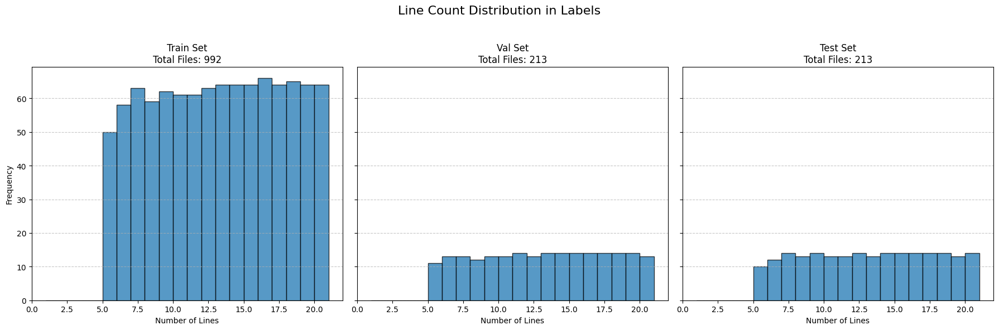

In [ ]:


# 데이터셋 경로 설정
base_path = "./new_dataset"
folders = ["train", "val", "test"]

# 결과 저장
line_counts = {}

# 각 폴더별로 라벨 파일의 줄 수를 계산
for folder in folders:
    label_path = os.path.join(base_path, folder, "labels")
    line_counts[folder] = []

    for txt_file in os.listdir(label_path):
        if txt_file.endswith(".txt"):
            txt_file_path = os.path.join(label_path, txt_file)
            with open(txt_file_path, "r") as file:
                lines = file.readlines()
                line_counts[folder].append(len(lines))

# 통계 출력 및 분포 시각화
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
fig.suptitle("Line Count Distribution in Labels", fontsize=16)

for idx, folder in enumerate(folders):
    counts = line_counts[folder]

    # 통계량 계산
    total_files = len(counts)
    mean_count = np.mean(counts)
    min_count = np.min(counts)
    max_count = np.max(counts)
    std_dev = np.std(counts)
    line_count_distribution = Counter(counts)

    # 통계 출력
    print(f"\n{folder.capitalize()} Labels Statistics:")
    print(f"- Total files: {total_files}")
    print(f"- Mean lines per file: {mean_count:.2f}")
    print(f"- Min lines: {min_count}")
    print(f"- Max lines: {max_count}")
    print(f"- Standard deviation: {std_dev:.2f}")
    print(f"- Line count distribution: {dict(line_count_distribution)}")

    # 분포 시각화
    ax = axes[idx]
    ax.hist(counts, bins=range(1, max(counts) + 2), alpha=0.75, edgecolor='black')
    ax.set_title(f"{folder.capitalize()} Set\nTotal Files: {total_files}")
    ax.set_xlabel("Number of Lines")
    if idx == 0:
        ax.set_ylabel("Frequency")
    ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the title
plt.show()


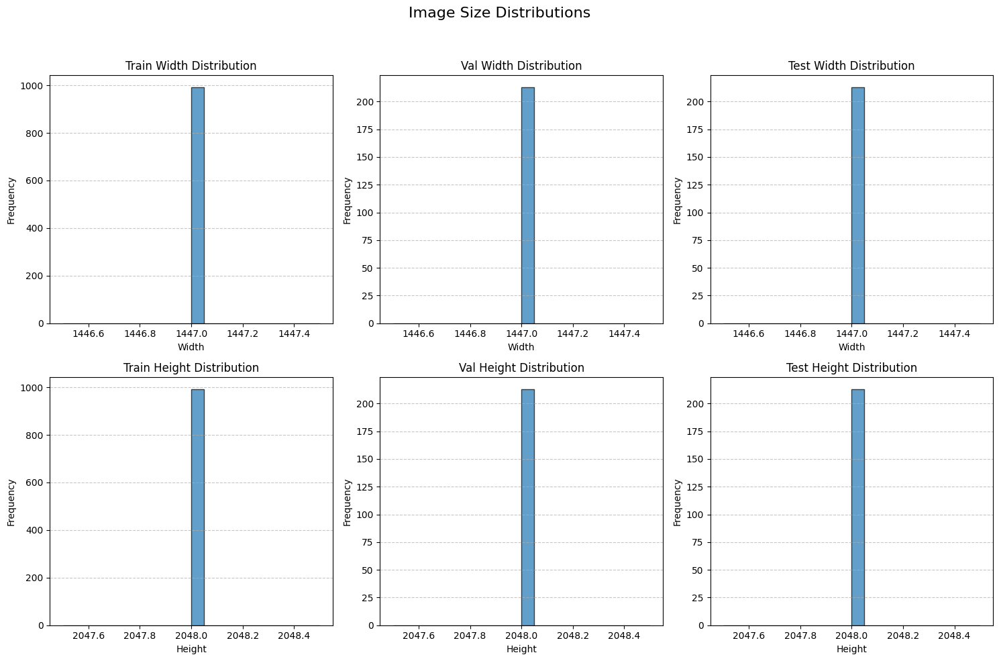


Total Unique Image Sizes Across All Sets: 1
Train Set:
- Total Images: 992
- Unique Sizes: 1
Val Set:
- Total Images: 213
- Unique Sizes: 1
Test Set:
- Total Images: 213
- Unique Sizes: 1


In [ ]:


def analyze_image_sizes(base_path):
    """Analyze image size distribution for train/val/test splits."""
    size_stats = {}
    unique_sizes = set()

    for split in ['train', 'val', 'test']:
        sizes = []
        images_path = os.path.join(base_path, split, 'images')

        if not os.path.exists(images_path):
            print(f"Warning: Path {images_path} not found.")
            continue

        for img_file in os.listdir(images_path):
            if img_file.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(images_path, img_file)
                with Image.open(img_path) as img:
                    width, height = img.size
                    sizes.append((width, height))
                    unique_sizes.add((width, height))

        size_stats[split] = sizes

    return size_stats, unique_sizes

def visualize_image_size_distribution(size_stats):
    """Visualize the distribution of image widths and heights in a 2x3 grid."""
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle("Image Size Distributions", fontsize=16)
    splits = ['train', 'val', 'test']
    metrics = ['Width', 'Height']

    for i, split in enumerate(splits):
        if size_stats[split]:
            widths, heights = zip(*size_stats[split])
            for j, metric in enumerate(metrics):
                ax = axes[j, i]
                data = widths if metric == 'Width' else heights
                ax.hist(data, bins=20, alpha=0.7, edgecolor='black')
                ax.set_title(f"{split.capitalize()} {metric} Distribution")
                ax.set_xlabel(metric)
                ax.set_ylabel("Frequency")
                ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Remove any empty subplots
    for i in range(2):
        for j in range(3):
            if 3 * i + j >= len(splits) * len(metrics):
                fig.delaxes(axes[i][j])

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the title
    plt.show()

def print_unique_size_counts(size_stats, unique_sizes):
    """Print the number of unique image sizes for each set."""
    print(f"\nTotal Unique Image Sizes Across All Sets: {len(unique_sizes)}")
    for split, sizes in size_stats.items():
        unique_split_sizes = len(set(sizes))
        print(f"{split.capitalize()} Set:")
        print(f"- Total Images: {len(sizes)}")
        print(f"- Unique Sizes: {unique_split_sizes}")

# Execute
base_path = 'new_dataset'
size_stats, unique_sizes = analyze_image_sizes(base_path)

# Visualize the distribution of image sizes
visualize_image_size_distribution(size_stats)

# Print the number of unique sizes
print_unique_size_counts(size_stats, unique_sizes)


100%|██████████| 992/992 [00:00<00:00, 21426.62it/s]


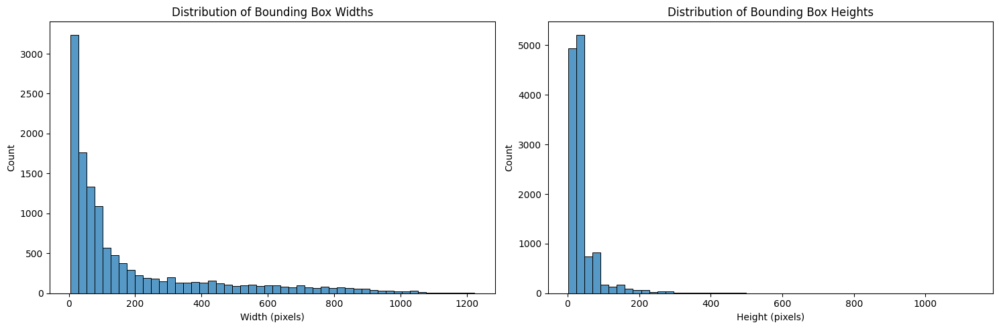


Width Statistics:
Mean: 184.89
Median: 77.00
Min: 4.00
Max: 1224.00

Height Statistics:
Mean: 42.18
Median: 28.00
Min: 2.00
Max: 1132.00


In [ ]:


# 라벨 파일이 있는 디렉토리 경로
labels_dir = '/content/new_dataset/train/labels'

# width와 height를 저장할 리스트
widths = []
heights = []

# 모든 txt 파일 처리
for txt_file in tqdm(os.listdir(labels_dir)):
    if txt_file.endswith('.txt'):
        file_path = os.path.join(labels_dir, txt_file)

        with open(file_path, 'r') as f:
            lines = f.readlines()

            for line in lines:
                # 각 줄의 좌표 추출
                values = line.strip().split()
                if len(values) == 5:  # class, x1, y1, x2, y2
                    _, x1, y1, x2, y2 = map(float, values)

                    # width와 height 계산
                    width = abs(x2 - x1)
                    height = abs(y2 - y1)

                    widths.append(width)
                    heights.append(height)

# 시각화
plt.figure(figsize=(15, 5))

# Width 분포
plt.subplot(1, 2, 1)
sns.histplot(widths, bins=50)
plt.title('Distribution of Bounding Box Widths')
plt.xlabel('Width (pixels)')
plt.ylabel('Count')

# Height 분포
plt.subplot(1, 2, 2)
sns.histplot(heights, bins=50)
plt.title('Distribution of Bounding Box Heights')
plt.xlabel('Height (pixels)')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

# 기본 통계 출력
print("\nWidth Statistics:")
print(f"Mean: {np.mean(widths):.2f}")
print(f"Median: {np.median(widths):.2f}")
print(f"Min: {np.min(widths):.2f}")
print(f"Max: {np.max(widths):.2f}")

print("\nHeight Statistics:")
print(f"Mean: {np.mean(heights):.2f}")
print(f"Median: {np.median(heights):.2f}")
print(f"Min: {np.min(heights):.2f}")
print(f"Max: {np.max(heights):.2f}")

#이미지 여백제거,흑백,흑백*3, 리사이징(768x1024),라벨좌표변환



In [ ]:


def create_directories(base_dir):
    # 메인 폴더 생성
    output_dir = Path(f'./processed_{base_dir}')
    if not output_dir.exists():
        output_dir.mkdir(parents=True, exist_ok=True)

    # train, val, test 폴더 생성
    for split in ['train', 'val', 'test']:
        split_dir = output_dir / split
        images_dir = split_dir / 'images'
        labels_dir = split_dir / 'labels'

        for dir in [split_dir, images_dir, labels_dir]:
            if not dir.exists():
                dir.mkdir(parents=True, exist_ok=True)

    return output_dir

def remove_margins(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    thresh = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY_INV)[1]
    coords = cv2.findNonZero(thresh)
    if coords is None:
        return image, (0, 0, image.shape[1], image.shape[0])

    x, y, w, h = cv2.boundingRect(coords)
    return image[y:y+h, x:x+w], (x, y, w, h)

def adjust_bounding_boxes(boxes, crop_info, original_size, target_size):
    x_offset, y_offset, crop_w, crop_h = crop_info  # 여백 제거로 잘린 영역 정보
    orig_w, orig_h = original_size                   # 원본 이미지 크기
    new_w, new_h = target_size                         # 리사이징된 크기

    adjusted_boxes = []

    for box in boxes:
        # 원본 좌표 파싱
        class_id, x1, y1, x2, y2 = map(int, box.strip().split())

        # 1단계: 여백 제거에 따른 좌표 조정
        # 잘린 영역의 시작점(offset)만큼 좌표를 이동
        x1 = x1 - x_offset
        x2 = x2 - x_offset
        y1 = y1 - y_offset
        y2 = y2 - y_offset

        # 2단계: 리사이징된 크기에 맞게 좌표 스케일링
        # (잘린 영역 크기 대비 새로운 크기의 비율만큼 조정)
        x1 = int((x1 * new_w) / crop_w)
        x2 = int((x2 * new_w) / crop_w)
        y1 = int((y1 * new_h) / crop_h)
        y2 = int((y2 * new_h) / crop_h)

        # 박스가 이미지 범위를 벗어나지 않도록 조정
        x1 = max(0, min(x1, new_w))
        x2 = max(0, min(x2, new_w))
        y1 = max(0, min(y1, new_h))
        y2 = max(0, min(y2, new_h))

        # 4단계: 유효한 박스인지 확인
        # 너비와 높이가 0보다 커야 함 (x2>x1, y2>y1)
        if x2 > x1 and y2 > y1:
            adjusted_boxes.append(f"{class_id} {x1} {y1} {x2} {y2}")

    return adjusted_boxes

def process_split(split_name, input_dir, output_dir, target_size=(768,1024)):
    print(f"\nProcessing {split_name} set...")
    input_images_dir = input_dir / split_name / 'images'
    input_labels_dir = input_dir / split_name / 'labels'

    output_images_dir = output_dir / split_name / 'images'
    output_labels_dir = output_dir / split_name / 'labels'

    # 지원하는 이미지 확장자
    valid_extensions = ['.jpg', '.jpeg', '.png', '.bmp']

    # 진행 상황 추적
    total_files = len(list(input_images_dir.glob('*.*')))
    processed_files = 0

    # 각 이미지 처리
    for img_path in input_images_dir.iterdir():
        if img_path.suffix.lower() in valid_extensions:
            try:
                # 대응하는 라벨 파일 경로
                label_path = input_labels_dir / f"{img_path.stem}.txt"

                if not label_path.exists():
                    print(f"Label file not found for {img_path.name}")
                    continue

                # 이미지 처리
                image = cv2.imread(str(img_path))
                original_size = (image.shape[1], image.shape[0])

                # 여백 제거
                cropped_image, crop_info = remove_margins(image)

                # 그레이스케일 변환
                gray = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)

                # 3채널로 다시 변환 (YOLOv8 입력용)
                gray_3ch = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

                # 리사이징
                resized_image = cv2.resize(gray_3ch, target_size)

                # 바운딩 박스 조정
                with open(label_path, 'r') as f:
                    boxes = f.readlines()

                adjusted_boxes = adjust_bounding_boxes(
                    boxes,
                    crop_info,
                    original_size,
                    target_size
                )

                # 결과 저장
                cv2.imwrite(str(output_images_dir / img_path.name), resized_image)

                with open(output_labels_dir / f"{img_path.stem}.txt", 'w') as f:
                    f.write('\n'.join(adjusted_boxes))

                processed_files += 1
                # 진행률 출력
                progress = (processed_files / total_files) * 100
                print(f"\rProgress: {progress:.1f}% ({processed_files}/{total_files})", end="")

            except Exception as e:
                print(f"\nError processing {img_path}: {e}")

    print(f"\nCompleted processing {split_name} set!")

def process_dataset():
    # 입력/출력 디렉토리 설정
    input_dir = Path('./new_dataset')
    output_dir = create_directories('new_dataset')

    # 각 분할 세트 처리
    for split in ['train', 'val', 'test']:
        process_split(split, input_dir, output_dir)

if __name__ == "__main__":
    process_dataset()


Processing train set...
Progress: 100.0% (992/992)
Completed processing train set!

Processing val set...
Progress: 100.0% (213/213)
Completed processing val set!

Processing test set...
Progress: 100.0% (213/213)
Completed processing test set!


#이미지, 라벨이 잘 변환됐는지 체크

Image Format: JPEG
Image Size: (768, 1024)
Image Mode: RGB
Image Info: {'jfif': 257, 'jfif_version': (1, 1), 'jfif_unit': 0, 'jfif_density': (1, 1)}
Number of Pixels: 786432


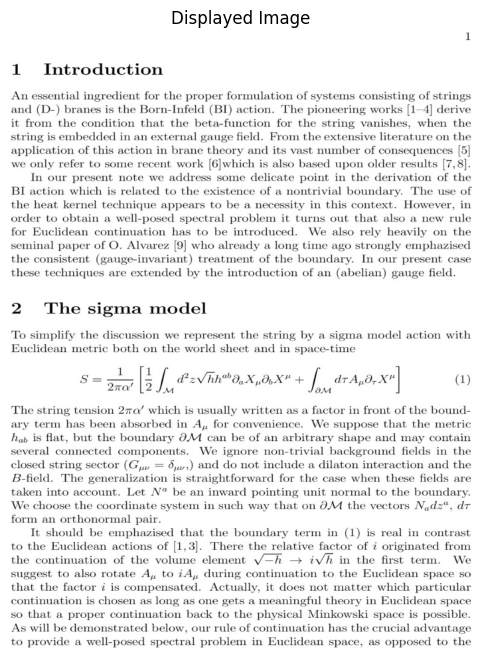

In [ ]:


# 이미지 경로
image_path = "/content/processed_new_dataset/test/images/0001125-page02.jpg"

# 이미지 열기 및 정보 출력
with Image.open(image_path) as img:
    # 이미지 기본 정보
    print(f"Image Format: {img.format}")           # 파일 형식 (e.g., JPEG, PNG)
    print(f"Image Size: {img.size}")               # 이미지 크기 (Width, Height)
    print(f"Image Mode: {img.mode}")               # 이미지 모드 (e.g., RGB, L)
    print(f"Image Info: {img.info}")               # 추가 정보 (e.g., EXIF)

    # 픽셀 데이터 읽기
    width, height = img.size
    pixel_data = img.getdata()
    print(f"Number of Pixels: {width * height}")

    # 이미지 표시
    plt.figure(figsize=(8, 8))  # 화면 크기 조정
    plt.imshow(img)
    plt.axis('off')             # 축 숨기기
    plt.title("Displayed Image")
    plt.show()


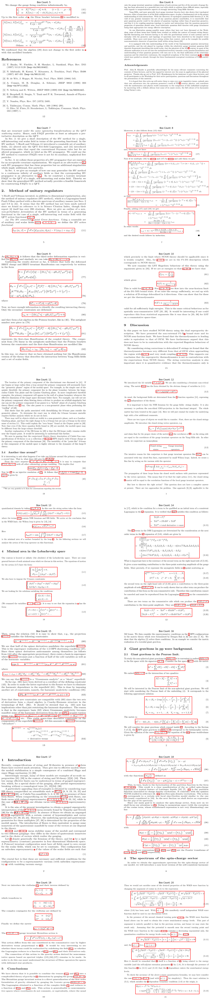

In [ ]:


def visualize_boxes(processed_dir, samples_per_box_count=1):
    # 결과를 저장할 이미지 배열 초기화
    fig, axes = plt.subplots(8, 2, figsize=(20, 80))
    fig.tight_layout(pad=5.0)

    processed_train_dir = Path(processed_dir) / 'train'
    images_dir = processed_train_dir / 'images'
    labels_dir = processed_train_dir / 'labels'

    # 5부터 20까지의 박스 수에 대해
    for i, box_count in enumerate(range(5, 21)):
        row = i // 2
        col = i % 2

        # 해당 박스 수를 가진 이미지 찾기
        for label_path in labels_dir.glob('*.txt'):
            with open(label_path, 'r') as f:
                boxes = f.readlines()
                if len(boxes) == box_count:
                    # 대응하는 이미지 로드
                    img_path = images_dir / f"{label_path.stem}.jpg"
                    img = cv2.imread(str(img_path))
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                    # 바운딩 박스 그리기
                    for box in boxes:
                        x1, y1, x2, y2 = map(int, box.strip().split()[1:])
                        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

                    # 플롯에 이미지 표시
                    axes[row, col].imshow(img)
                    axes[row, col].set_title(f'Box Count: {box_count}')
                    axes[row, col].axis('off')
                    break

    plt.show()

# 시각화 실행
visualize_boxes('/content/processed_new_dataset')

#라벨좌표 정규화

In [ ]:

def convert_to_yolo_format(base_dir, img_size=(768, 1024)):  # 이미지 크기 수정
    for split in ['train', 'val', 'test']:
        print(f"\nProcessing {split} set labels...")
        labels_dir = Path(base_dir) / split / 'labels'
        label_files = list(labels_dir.glob('*.txt'))

        for label_path in tqdm(label_files, desc=f'Converting {split} labels'):
            try:
                with open(label_path, 'r') as f:
                    boxes = f.readlines()

                yolo_boxes = []
                for box in boxes:
                    class_id, x1, y1, x2, y2 = map(float, box.strip().split())

                    # 중심점 계산
                    x_center = (x1 + x2) / 2
                    y_center = (y1 + y2) / 2

                    # 너비, 높이 계산
                    width = x2 - x1
                    height = y2 - y1

                    # 정규화 (0~1)
                    x_center = max(0, min(1, x_center / img_size[0]))  # 범위 제한 추가
                    y_center = max(0, min(1, y_center / img_size[1]))
                    width = max(0, min(1, width / img_size[0]))
                    height = max(0, min(1, height / img_size[1]))

                    # 유효성 검사 추가
                    if width > 0 and height > 0:
                        # YOLO 포맷으로 저장 (class_id x_center y_center width height)
                        yolo_boxes.append(f"{int(class_id)} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

                with open(label_path, 'w') as f:
                    f.write('\n'.join(yolo_boxes))

            except Exception as e:
                print(f"\nError processing {label_path}: {e}")

# 실행
convert_to_yolo_format('/content/processed_new_dataset', img_size=(768, 1024))


Processing train set labels...


Converting train labels: 100%|██████████| 992/992 [00:00<00:00, 5785.38it/s]



Processing val set labels...


Converting val labels: 100%|██████████| 213/213 [00:00<00:00, 4697.31it/s]



Processing test set labels...


Converting test labels: 100%|██████████| 213/213 [00:00<00:00, 6448.86it/s]


#학습

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 48.4 MB/s eta 0:00:00


In [ ]:
# Create dataset.yaml
yaml_content = """
path: /content/processed_new_dataset  # dataset root dir
train: train/images  # train images
val: val/images  # val images
test: test/images  # test images

nc: 1  # number of classes
names: ['equation']  # class names
"""

with open('dataset.yaml', 'w') as f:
    f.write(yaml_content)




In [ ]:
from ultralytics import YOLO

# 모델 로드
model = YOLO('yolov8s.pt')

# 학습 설정
hyperparameters = dict(
    # 데이터셋 관련
    data='dataset.yaml',

    # 학습 관련
    epochs=50,  # 최대 에폭
    patience=8,  # early stopping patience
    batch=32,  # 배치 크기
    imgsz=(768, 1024),  # 입력 이미지 크기


    conf=0.25,  #  신뢰도 임계값
    iou=0.7,  #  IoU 임계값

    # 과적합 방지
    dropout=0.2,  # dropout 추가
    weight_decay=0.001,  # L2 정규화

    # 학습률 설정
    lr0=0.01,  # 초기 학습률
    lrf=0.01,  # 최종 학습률
    warmup_epochs=3,  # 웜업 에폭

    # 손실 가중치 (수식 탐지 정확도 )
    box=7.5,  # 바운딩 박스 손실 가중치
    cls=0.3,  # 분류 손실 가중치 (단일 클래스)

    # 필수 체크포인트만 저장
    save_period=10,  # 10에폭마다 저장
)

# 학습 시작
results = model.train(**hyperparameters)

Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=dataset.yaml, epochs=50, time=None, patience=8, batch=32, imgsz=(768, 1024), save=True, save_period=10, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=0.25, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

100%|██████████| 755k/755k [00:00<00:00, 106MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 326MB/s]


AMP: checks passed ✅
WARNING ⚠️ updating to 'imgsz=1024'. 'train' and 'val' imgsz must be an integer, while 'predict' and 'export' imgsz may be a [h, w] list or an integer, i.e. 'yolo export imgsz=640,480' or 'yolo export imgsz=640'


train: Scanning /content/processed_new_dataset/train/labels... 992 images, 0 backgrounds, 0 corrupt: 100%|██████████| 992/992 [00:00<00:00, 1105.07it/s]


train: New cache created: /content/processed_new_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/processed_new_dataset/val/labels... 213 images, 0 backgrounds, 0 corrupt: 100%|██████████| 213/213 [00:00<00:00, 945.89it/s]

val: New cache created: /content/processed_new_dataset/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.001), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      19.2G      2.258      2.084      1.684        712       1024: 100%|██████████| 31/31 [00:28<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.16it/s]

                   all        213       2705      0.516      0.601      0.556      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      18.2G      1.264     0.7318      1.063        599       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]


                   all        213       2705      0.389      0.477      0.394       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      18.4G      1.196     0.6414      1.029        695       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all        213       2705      0.507      0.526      0.495      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      18.9G      1.156     0.5964      1.024        698       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        213       2705      0.624      0.728      0.645      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      18.7G      1.158     0.5827      1.007        521       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        213       2705      0.816      0.759      0.828      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      18.2G      1.074     0.5316     0.9911        702       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.752      0.715      0.749        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      18.5G       1.05     0.5199      0.986        748       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        213       2705       0.83      0.769      0.835      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      18.3G      1.032     0.5068     0.9768        582       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        213       2705       0.83      0.747      0.826      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      18.2G     0.9877     0.4752     0.9551        657       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.835      0.782       0.85       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      18.1G     0.9792     0.4565     0.9443        662       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        213       2705      0.875      0.838      0.899      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      18.5G     0.9373     0.4356     0.9405        636       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        213       2705      0.822      0.727      0.809      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      18.2G     0.9237     0.4335     0.9319        689       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        213       2705      0.888      0.838      0.912      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      18.6G     0.9039      0.418      0.928        680       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]


                   all        213       2705      0.688      0.334      0.525      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      18.3G     0.9293     0.4288     0.9392        601       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705       0.85      0.846      0.879      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      18.8G     0.9261      0.423     0.9347        642       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.876      0.855      0.909      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      18.1G     0.9029     0.4101      0.931        663       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.767      0.731      0.781      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      18.5G     0.8815     0.4053     0.9225        542       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]


                   all        213       2705      0.801      0.518      0.682      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      18.7G      0.887     0.4057     0.9226        781       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.904      0.856      0.918      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      18.7G      0.858     0.3886     0.9123        752       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        213       2705      0.906      0.859      0.916       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      18.6G     0.8661      0.394     0.9133        754       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        213       2705       0.89      0.881      0.917      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      18.4G     0.8563     0.3772     0.9171        643       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.863      0.631      0.759      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      18.7G      0.851     0.3713     0.9088        671       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        213       2705      0.913      0.876      0.928      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      18.5G     0.8319     0.3676     0.9048        722       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        213       2705      0.907      0.893      0.939      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      18.4G     0.8041     0.3532      0.899        657       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.93it/s]

                   all        213       2705      0.915      0.891      0.939      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      18.2G     0.8238     0.3634     0.9032        667       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        213       2705      0.899      0.859      0.918      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      18.8G     0.8169     0.3633     0.9023        580       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.826       0.78      0.844      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      18.3G     0.7948     0.3464     0.8991        720       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]


                   all        213       2705      0.909      0.846      0.916      0.728

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      18.5G     0.8016     0.3463     0.8983        574       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        213       2705      0.924      0.889      0.938      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      18.3G     0.8022     0.3455      0.894        753       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.913      0.885      0.931      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      18.4G     0.7972     0.3419     0.8983        546       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        213       2705      0.832      0.674      0.777      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      18.6G     0.7907     0.3379     0.8938        725       1024: 100%|██████████| 31/31 [00:27<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        213       2705      0.891      0.884      0.922      0.751
EarlyStopping: Training stopped early as no improvement observed in last 8 epochs. Best results observed at epoch 23, best model saved as best.pt.
To update EarlyStopping(patience=8) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



31 epochs completed in 0.261 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]


                   all        213       2705      0.907      0.893      0.939      0.761
Speed: 0.3ms preprocess, 5.3ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/train


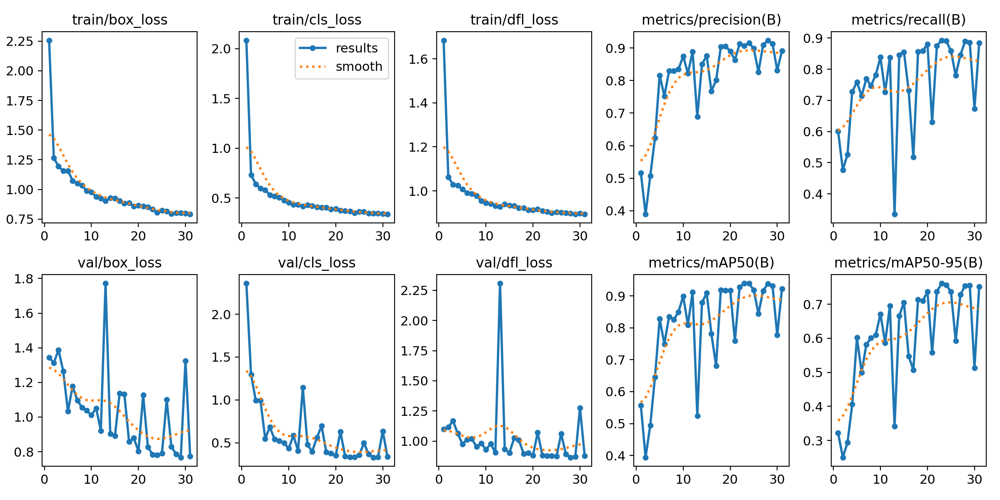

In [ ]:
from IPython.display import Image, display

# 결과 이미지 경로
result_path = "runs/detect/train/results.png"

# 결과 이미지 출력
display(Image(filename=result_path))

In [ ]:
# 학습된 모델 로드 (best.pt로 저장됨)
model = YOLO('/content/runs/detect/train/weights/best.pt')

# 테스트 데이터 평가
results = model.val(data='dataset.yaml', split='test')

# 평균 Precision과 Recall 계산
precision_mean = results.box.p.mean()
recall_mean = results.box.r.mean()

print("\n테스트 세트 평가 결과:")
print(f"mAP50: {results.box.map50:.3f}")
print(f"mAP50-95: {results.box.map:.3f}")
print(f"Precision (mean): {precision_mean:.3f}")
print(f"Recall (mean): {recall_mean:.3f}")


Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/processed_new_dataset/test/labels.cache... 213 images, 0 backgrounds, 0 corrupt: 100%|██████████| 213/213 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.51it/s]


                   all        213       2707      0.909      0.881      0.934      0.724
Speed: 0.4ms preprocess, 8.9ms inference, 0.0ms loss, 6.3ms postprocess per image
Results saved to runs/detect/val3

테스트 세트 평가 결과:
mAP50: 0.934
mAP50-95: 0.724
Precision (mean): 0.909
Recall (mean): 0.881


#conf_scores: best vs worst 시각화
###Confidence Score=P(Object)×IOU(predicted box, ground truth box)



0: 1024x768 11 equations, 8.8ms
Speed: 4.1ms preprocess, 8.8ms inference, 2.3ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 15 equations, 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 15 equations, 8.0ms
Speed: 4.9ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 14 equations, 7.6ms
Speed: 2.7ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 21 equations, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 17 equations, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.3ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 5 equations, 7.3ms
Speed: 2.8ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 19 equations, 7.3ms
Speed: 2.6ms preprocess, 7.3ms inference, 1.3ms postproces

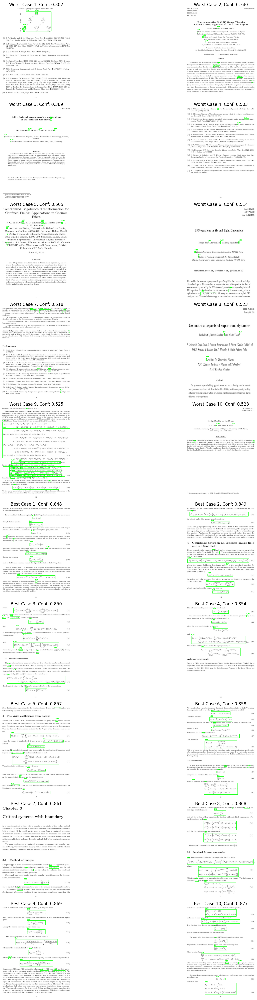

In [ ]:
from ultralytics import YOLO
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

model = YOLO('/content/runs/detect/train/weights/best.pt')
test_images_path = Path('/content/processed_new_dataset/test/images')
test_labels_path = Path('/content/processed_new_dataset/test/labels')

# 각 이미지에 탐지된 박스들의 평균 신뢰도 계산 및 반환
def evaluate_detections(image_path, conf_threshold=0.25):
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # BGR to RGB
    results = model.predict(image, conf=conf_threshold, iou=0.7)
    pred_boxes = results[0].boxes.xyxy.cpu().numpy()
    conf_scores = results[0].boxes.conf.cpu().numpy()

    # Draw predictions
    for box, conf in zip(pred_boxes, conf_scores):
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, f'{conf:.2f}', (x1, y1-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    return image, results[0].boxes.conf.mean().item()

# 모든 테스트 이미지 평가
results_dict = {}
for img_path in test_images_path.glob('*.jpg'):
    _, conf_score = evaluate_detections(img_path)
    results_dict[img_path] = conf_score

# 성능순 정렬
sorted_results = sorted(results_dict.items(), key=lambda x: x[1])
worst_cases = sorted_results[:10]
best_cases = sorted_results[-10:]

# 시각화
plt.figure(figsize=(20, 40))

# worst cases
print("가장 낮은 신뢰도 케이스들:")
for i, (img_path, conf) in enumerate(worst_cases):
    plt.subplot(10, 2, i+1)
    image, _ = evaluate_detections(img_path)
    plt.imshow(image)
    plt.title(f'Worst Case {i+1}, Conf: {conf:.3f}')
    plt.axis('off')

# best cases
print("\n가장 높은 신뢰도 케이스들:")
for i, (img_path, conf) in enumerate(best_cases):
    plt.subplot(10, 2, i+11)
    image, _ = evaluate_detections(img_path)
    plt.imshow(image)
    plt.title(f'Best Case {i+1}, Conf: {conf:.3f}')
    plt.axis('off')

plt.tight_layout()
plt.show()